<a href="https://colab.research.google.com/github/fbeilstein/presentations/blob/master/regression_problem_for_July_5_2021.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [43]:
#@title #Download and import dataset
#@markdown Run this block of code to download the dataset (images) for classification.
#@markdown This is a simplified version of the https://www.kaggle.com/anlgrbz/super-conductors dataset from Kaggle.
#@markdown You may want to check the description of the original dataset for more information.
#@markdown If you feel interested in this topic check https://www.nature.com/articles/s41524-018-0085-8 article in "Nature".
#@markdown Make sure no error occurs, otherwise ask for help.
#@markdown
#@markdown After execution is complete, the dataset is ready to use.
#@markdown You should see the table displayed.
#@markdown Columns are marked as follows
#@markdown
#@markdown |column | meaning | units | description|
#@markdown |---|---|---|---|
#@markdown |`n_elements`| # of elements | 1 | number of different elements in chemical composition
#@markdown |`atomic_mass`| atomic mass | AMU, atomic mass units | mean atomic mass
#@markdown |`fie`| first ionization energy | kJ/mole | mean energy required to remove a valence electron
#@markdown |`atomic_radius`| atomic radius | pm | mean calculated atomic radius
#@markdown |`density`| density | kg/m^3 | density at standart temperature and pressure
#@markdown |`e_affinity`| electron affinity | kJ/mole | mean energy required to an electron to a neutral atom
#@markdown |`fusion_heat`| fusion heat | kJ/mole | energy to change from solid to liquid without temperature change
#@markdown |`t_conductivity`| thermal conductivity | W/(m * K) | thermal conductivity coefficient
#@markdown |`valence`| valence | 1 | mean number of chemical bonds formed by element
#@markdown |`critical_temp`| critical temperature | K | temperature of superconductor-conductor transition
#@markdown
#@markdown There will be two variables available 
#@markdown 
#@markdown | variable | meaning |
#@markdown |---|---|
#@markdown `features_X` | Data from all columns except `critical_temp`. Use this data as input for prediction.
#@markdown `class_Y` | `critical_temp` column. This is what you need to predict. 
#@markdown

!wget https://raw.githubusercontent.com/fbeilstein/presentations/master/datasets/superconductors.csv

from google.colab import output
output.clear()

def pandas_to_html(obj, ordering=False):
  import pandas as pd
  if type(obj) == pd.core.series.Series:
    if obj.name != None:
      obj = pd.DataFrame(obj)#, columns=[' '])
    else:
      obj = pd.DataFrame(obj, columns=[' '])
  
  class_name = 'pandas_table'
  if obj.shape[0] > 10:
    class_name += '_long'
  else:
    class_name += '_short'

  if ordering:
    class_name += '_ordered'
  else:
    class_name += '_unordered'


  main_str = '''
  <script src="https://ajax.googleapis.com/ajax/libs/jquery/3.5.1/jquery.min.js"></script>
  <link rel="stylesheet" type="text/css" href="https://cdn.datatables.net/1.10.21/css/jquery.dataTables.css">
  <script type="text/javascript" charset="utf8" src="https://cdn.datatables.net/1.10.21/js/jquery.dataTables.js"></script>
  ''' + obj.to_html(classes=[class_name, 'cell-border'],index=False) + '''
  <script>
  $(document).ready( function () {
      $('.pandas_table_long_ordered').DataTable({"autoWidth": false});
      $('.pandas_table_long_ordered').removeClass("pandas_table_long_ordered");
      $('.pandas_table_short_ordered').DataTable({"autoWidth": false, "paging":false, "searching":false, "info":false});
      $('.pandas_table_short_ordered').removeClass("pandas_table_short_ordered");

      $('.pandas_table_long_unordered').DataTable({"autoWidth": false, "ordering":false, "paging":true});
      $('.pandas_table_long_unordered').removeClass("pandas_table_long_unordered");
      $('.pandas_table_short_unordered').DataTable({"autoWidth": false, "paging":false, "searching":false, "info":false, "ordering":false});
      $('.pandas_table_short_unordered').removeClass("pandas_table_short_unordered");
  } );
  </script>
  '''
  return main_str

def display_pandas(obj, ordering=False):
  import IPython
  from google.colab import output
  display(IPython.display.HTML(pandas_to_html(obj, ordering)))

import pandas as pd
superconductors_tbl = pd.read_csv('superconductors.csv', index_col=False, 
                                  usecols=['number_of_elements', 
                                           'mean_atomic_mass',
                                           'mean_fie',
                                           'mean_atomic_radius',
                                           'mean_Density',
                                           'mean_ElectronAffinity',
                                           'mean_FusionHeat',
                                           'mean_ThermalConductivity',
                                           'mean_Valence',
                                           'critical_temp'])
superconductors_tbl = superconductors_tbl.set_axis(['n_elements', 
                                           'atomic_mass',
                                           'fie',
                                           'atomic_radius',
                                           'density',
                                           'e_affinity',
                                           'fusion_heat',
                                           't_conductivity',
                                           'valence',
                                           'critical_temp'], axis='columns')
display_pandas(superconductors_tbl)

features_X = superconductors_tbl.to_numpy()
class_Y = features_X[:,-1]
features_X = features_X[:,:-1]

n_elements,atomic_mass,fie,atomic_radius,density,e_affinity,fusion_heat,t_conductivity,valence,critical_temp
4,88.944468,775.425000,160.250000,4654.357250,81.837500,6.905500,107.756645,2.250000,29.000000
5,92.729214,766.440000,161.200000,5821.485800,90.890000,7.784400,172.205316,2.000000,26.000000
4,88.944468,775.425000,160.250000,4654.357250,81.837500,6.905500,107.756645,2.250000,19.000000
4,88.944468,775.425000,160.250000,4654.357250,81.837500,6.905500,107.756645,2.250000,22.000000
4,88.944468,775.425000,160.250000,4654.357250,81.837500,6.905500,107.756645,2.250000,23.000000
4,88.944468,775.425000,160.250000,4654.357250,81.837500,6.905500,107.756645,2.250000,23.000000
4,88.944468,775.425000,160.250000,4654.357250,81.837500,6.905500,107.756645,2.250000,11.000000
4,76.517718,787.050000,151.750000,4434.357250,79.607500,6.905500,112.006645,2.250000,33.000000
4,76.517718,787.050000,151.750000,4434.357250,79.607500,6.905500,112.006645,2.250000,36.000000
4,76.517718,787.050000,151.750000,4434.357250,79.607500,6.905500,112.006645,2.250000,31.000000


**Problem:**
print zeroth and first element of `features_X` and `class_Y`.
Find these numbers in the table above.
Make sure you undestand the structure of `features_X` and `class_Y`.

In [ ]:
print(features_X[0:2], class_Y[0:2])

[[4.00000000e+00 8.89444675e+01 7.75425000e+02 1.60250000e+02
  4.65435725e+03 8.18375000e+01 6.90550000e+00 1.07756645e+02
  2.25000000e+00]
 [5.00000000e+00 9.27292140e+01 7.66440000e+02 1.61200000e+02
  5.82148580e+03 9.08900000e+01 7.78440000e+00 1.72205316e+02
  2.00000000e+00]] [29. 26.]


In [ ]:
import numpy as np

np.sum(np.corrcoef(features_X, rowvar=False) > 0.8)

9

In [98]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler().fit(features_X)
print(scaler.mean_)
print(scaler.scale_)
X_scaled = scaler.transform(features_X)

[4.11522363e+00 8.75576309e+01 7.69614748e+02 1.57983101e+02
 6.11146521e+03 7.68797506e+01 1.42961127e+01 8.97069109e+01
 3.19822846e+00]
[1.43926081e+00 2.96757994e+01 8.74866368e+01 2.01468146e+01
 2.84671824e+03 2.77012382e+01 1.12999222e+01 3.85165790e+01
 1.04458689e+00]


In [61]:
features_X.shape

(21263, 9)

In [99]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

#model = LinearRegression(fit_intercept=True)
model = make_pipeline(PolynomialFeatures(5), LinearRegression(fit_intercept=True))
model.fit(X_scaled, class_Y)
print(np.sum(np.abs(model.predict(X_scaled) - class_Y) < 10))
model.score(X_scaled, class_Y)

14475


0.8320596538277336

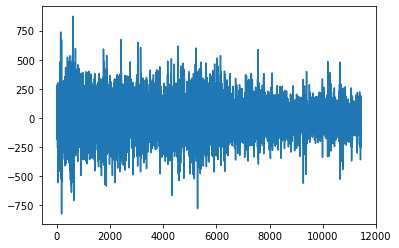

In [87]:
import matplotlib.pyplot as plt

plt.plot(model.named_steps.linearregression.coef_)

In [100]:
takeout = (np.abs(model.predict(X_scaled) - class_Y) < 15)

In [101]:
np.sum(takeout)
X_scaled_1 = X_scaled[takeout]
class_Y_1 = class_Y[takeout]
X_scaled_1.shape

(16796, 9)

In [102]:
model.fit(X_scaled_1, class_Y_1)
print(np.sum(np.abs(model.predict(X_scaled_1) - class_Y_1) < 1))
model.score(X_scaled_1, class_Y_1)

4603


0.9705371874787431

In [103]:
X_scaled_2 = X_scaled[np.logical_not(takeout)]
class_Y_2 = class_Y[np.logical_not(takeout)]
X_scaled_2.shape

(4467, 9)

In [104]:
model.fit(X_scaled_2, class_Y_2)
print(np.sum(np.abs(model.predict(X_scaled_2) - class_Y_2) < 1))
model.score(X_scaled_2, class_Y_2)

722


0.6010112540239476

In [62]:
X_scaled_2.shape, X_scaled.shape

((21263, 9), (21263, 9))

In [60]:
takeout

array([False, False, False, ...,  True,  True, False])

In [ ]:
model.coef_

array([  9.67015364,   9.85823718,  12.36053068,  10.32508535,
       -15.46201077,  -5.95166274,  -0.8595197 ,  11.45250252,
        -0.15633309])

In [ ]:
from sklearn.utils import resample

params = pd.Series(model.coef_, index=superconductors_tbl.columns[:-1])

np.random.seed(10)
err = np.std([model.fit(*resample(X_scaled, class_Y)).coef_ for i in range(1000)], 0)
print(pd.DataFrame({'effect': params.round(0), 'error': err.round(0)}))

                effect  error
n_elements        10.0    0.0
atomic_mass       10.0    0.0
fie               12.0    0.0
atomic_radius     10.0    0.0
density          -15.0    0.0
e_affinity        -6.0    0.0
fusion_heat       -1.0    0.0
t_conductivity    11.0    0.0
valence           -0.0    0.0
